# Image Classification Using Deep Learning (CNNs)

## Business Understanding

### Introduction

Nour Medicine is a forward-thinking healthcare technology company dedicated to tackling pressing global health issues. One of their primary concerns is childhood pneumonia, a leading cause of child mortality worldwide according to UNICEF. Rapid and accurate pneumonia diagnosis is critical to saving young lives.


Our project aligns closely with Nour Medicine's mission. They aim to employ machine learning for the early detection of pneumonia in chest X-ray images. By utilizing our AI model, "Nour Medicine" intends to empower healthcare providers in underserved regions and developing countries where access to specialized radiologists is limited. Their goal is to expedite pneumonia diagnosis, ensuring that patients, especially children, receive life-saving treatment without undue delays or the need to travel to distant specialists.


The successful implementation of our machine learning model has significant implications:

Nour Medicine: Our project positions "Nour Medicine" as a trailblazer in healthcare technology, providing them with a state-of-the-art pneumonia diagnostic tool that aligns perfectly with their mission to enhance global health outcomes. This addition to their product portfolio enhances their reputation and competitiveness in the healthcare technology market.

Healthcare Providers: By adopting our system, healthcare providers in resource-constrained areas gain access to a powerful diagnostic tool. This simplifies and accelerates the diagnostic process, reducing the risks associated with delayed diagnosis and enhancing patient care.

Patients: Children and individuals in underserved regions benefit from quicker and more accurate diagnoses, increasing their chances of receiving timely and life-saving treatment.

Global Health Community: Our project showcases the potential of machine learning in addressing critical healthcare challenges and can serve as a model for similar initiatives globally, contributing to improved global health outcomes.

## Data Understanding

### Data Sources


The dataset used in this project is sourced from Kaggle, a popular platform for data science and machine learning enthusiasts. Specifically, we have used the ["Chest X-Ray Images"](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia) available on Kaggle's platform. This dataset consists of a collection of chest X-ray images along with associated labels for pneumonia detection.

### Why This Data?
The choice of this Kaggle dataset is driven by its relevance to the real-world problem of pneumonia detection. It aligns perfectly with the project's goal of developing an AI-based solution to assist in pneumonia diagnosis. The dataset's suitability is as follows:

 **Medical Relevance: Chest X-ray images are a standard diagnostic tool for pneumonia. Utilizing real medical data enhances the project's applicability to healthcare scenarios.**

 **Size: The dataset is sufficiently large to train and evaluate a robust machine learning model.**

### Data Structure
The dataset used in this project is organized into three main directories: "train," "test," and "val." Each of these directories contains subdirectories for "NORMAL" (indicating pneumonia-negative cases) and "PNEUMONIA" (indicating pneumonia-positive cases). The structure of the dataset is as follows:

 **Train Data**: The "train" directory contains two subdirectories:

  "NORMAL": This subdirectory includes chest X-ray images from patients without pneumonia.
  
  "PNEUMONIA": This subdirectory includes chest X-ray images from patients with pneumonia.

 **Test Data**: The "test" directory also contains "NORMAL" and "PNEUMONIA" subdirectories, housing chest X-ray images for testing the trained models.

 **Validation Data**: The "val" directory, similar to the training and testing data, includes "NORMAL" and "PNEUMONIA" subdirectories. These images were manually selected from the training data to create a validation set.


**IMPORTANT NOTICE:**

***Prior to performing any modeling, it's worth noting that the provided validation dataset was insufficient in size for effective use. To address this, approximately 15% of the train data was manually moved into the validation folder. The remaining images in the training folder were used for model training, while the test data was used as provided.***

### Data Limitations
It's important to acknowledge the limitations of the Kaggle dataset, which may have implications for the project:

**Data Imbalance**: The dataset may exhibit class imbalance, with a greater number of pneumonia-negative cases. This imbalance could affect model training and evaluation.

**Limited Clinical Data**: The Kaggle dataset may lack detailed clinical information, such as patient history, comorbidities, or laboratory results. This limitation could impact the depth of analysis and the model's ability to generalize.

**Data Variability**: Variability in X-ray image quality, lighting conditions, and equipment used in data collection may introduce noise into the dataset.

## Data Preparation

### How to move the images from the train set into the validation set
#### Step 1: Navigate to the 'chest_xray/train/NORMAL' directory
cd C:\path\to\chest_xray\train\NORMAL
#### Step 2: Get a list of files and select the first 201 files
$filesToMove = Get-ChildItem | Select-Object -First 201

#### Step 3: Move the selected files to 'chest_xray/val/NORMAL'
Move-Item $filesToMove C:\path\to\chest_xray\val\NORMAL


####  And you do the same for the "PNEUMONIA" class
#### Step 4: Confirmation
You can verify that the files have been moved to the validation set

In [1]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=5690d51b55ee0c84036c08ce13648304a2ff219ab502e8febe5b4056b905f321
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
#GPU acceleration
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [3]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from lime import lime_image
import tensorflow as tf
from tensorflow.keras import models, layers, metrics, preprocessing, callbacks, optimizers

# Suppress warnings
warnings.filterwarnings("ignore")
%matplotlib inline

#### When using this notebook make sure to adapt the code below to your environment i.e change the paths

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
train_path = '/content/drive/MyDrive/Phase-4-project/train'
test_path = '/content/drive/MyDrive/Phase-4-project/test'
val_path = '/content/drive/MyDrive/Phase-4-project/val'

In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Define image dimensions
image_height, image_width = 224, 224

# Create data generators with preprocessing and augmentation for training data
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,             # Normalize pixel values to [0, 1]
    rotation_range=20,            # Random rotation
    width_shift_range=0.2,        # Random horizontal shift
    height_shift_range=0.2,       # Random vertical shift
    horizontal_flip=True,         # Random horizontal flip
    shear_range=0.2,              # Shear intensity
    zoom_range=0.2                # Random zoom
)

# Create data generators for validation and test data (only rescaling)
val_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

In [8]:
# Flow data from directories and apply preprocessing
batch_size = 32

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='binary'  # Assuming binary classification (e.g., pneumonia vs. normal)
)

val_generator = val_datagen.flow_from_directory(
    val_path,
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='binary'
)

Found 4434 images belonging to 2 classes.
Found 798 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


#### The code above sets up data generators for training, validation, and test data. It applies preprocessing and augmentation techniques to the training data while only normalizing the validation and test data.

**Let's look at the data distribution of all the datasets**

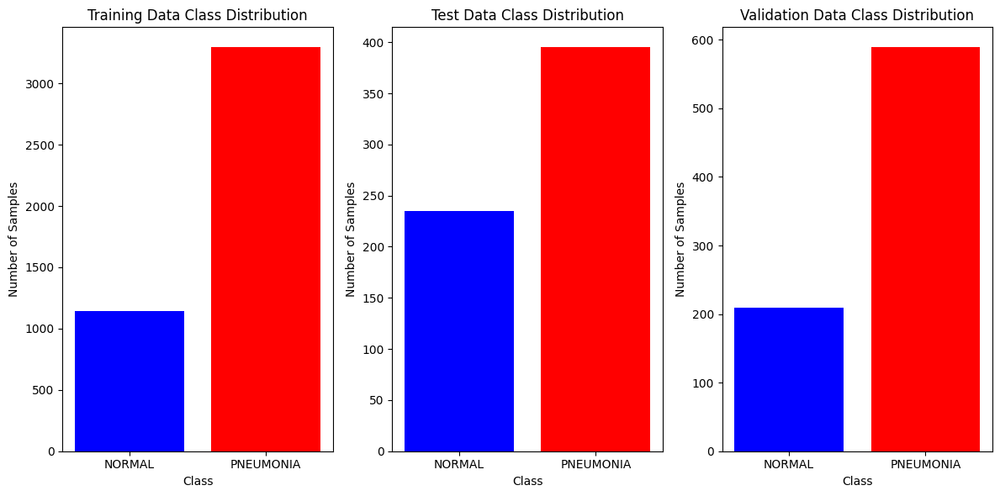

In [ ]:
import matplotlib.pyplot as plt
import os

# Function to count samples in each class for a given dataset
def count_samples_in_dataset(dataset_path):
    class_counts = {'NORMAL': 0, 'PNEUMONIA': 0}
    for class_name in class_counts.keys():
        class_dir = os.path.join(dataset_path, class_name)
        class_counts[class_name] = len(os.listdir(class_dir))
    return class_counts

# Count samples in each class for training, test, and validation datasets
train_counts = count_samples_in_dataset(train_path)
test_counts = count_samples_in_dataset(test_path)
val_counts = count_samples_in_dataset(val_path)

# Define colors for the bars
colors = ['blue', 'red']

# Create a bar chart to visualize class distribution for all datasets
plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.bar(train_counts.keys(), train_counts.values(), color=colors)
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Training Data Class Distribution')

plt.subplot(132)
plt.bar(test_counts.keys(), test_counts.values(), color=colors)
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Test Data Class Distribution')

plt.subplot(133)
plt.bar(val_counts.keys(), val_counts.values(), color=colors)
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Validation Data Class Distribution')

plt.tight_layout()
plt.show()


#### Class Imbalance clearly is an issue.
Training with imbalanced data could lead to a faulty model with increases in both false negative and positive cases.

Creating a model with a tendency towards false negatives would be dangerous as people who do have the disease are incorrectly classified as not having it and people could die.

Also creating a model with a tendency towards false positives would lead into wastage of valuable resources that could be used to treat an actual sick person.

Although both are bad , False negatives are worse than false positives in this scenario.

**That being said a lot of the medical data available for use is imbalanced either it is too many sick cases or too many normal cases.**

**Our Data has almost 1:2.5 imbalance in all the datasets.**

**I don't think this would affect us too much and create skewed results.**

## Data Visualization

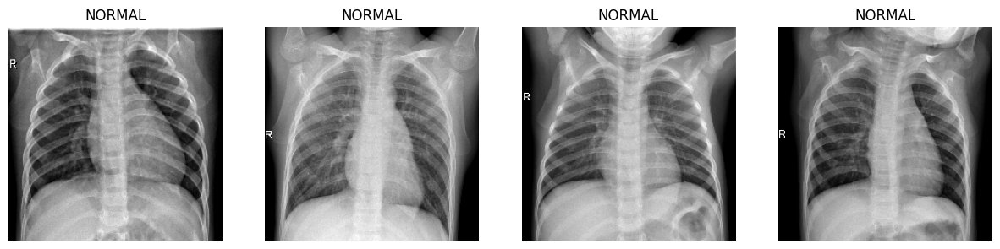

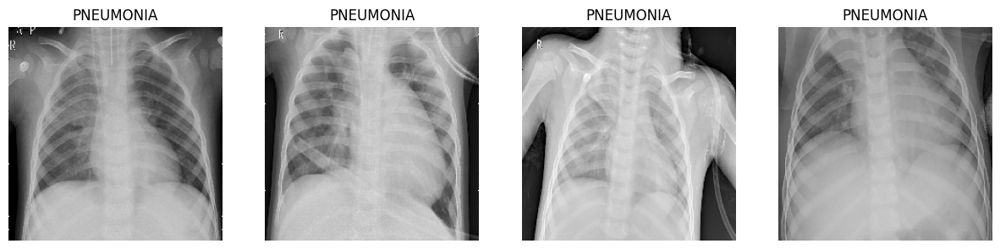

In [ ]:
##Let's take a look at a few images of both normal and sick x-ray images
import random
from tensorflow.keras.preprocessing import image

# Define the classes and their respective labels
class_labels = ['NORMAL', 'PNEUMONIA']

# Number of images to display per class
num_images_per_class = 4

# Function to display random images from a given class
def display_random_images(class_label, num_images):
    class_dir = os.path.join(train_path, class_label)
    image_files = random.sample(os.listdir(class_dir), num_images)

    plt.figure(figsize=(15, 5))
    for i, image_file in enumerate(image_files):
        img_path = os.path.join(class_dir, image_file)
        img = image.load_img(img_path, target_size=(image_height, image_width))
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.title(class_label)
        plt.axis('off')

# Display random images from both classes
for class_label in class_labels:
    display_random_images(class_label, num_images_per_class)

plt.show()


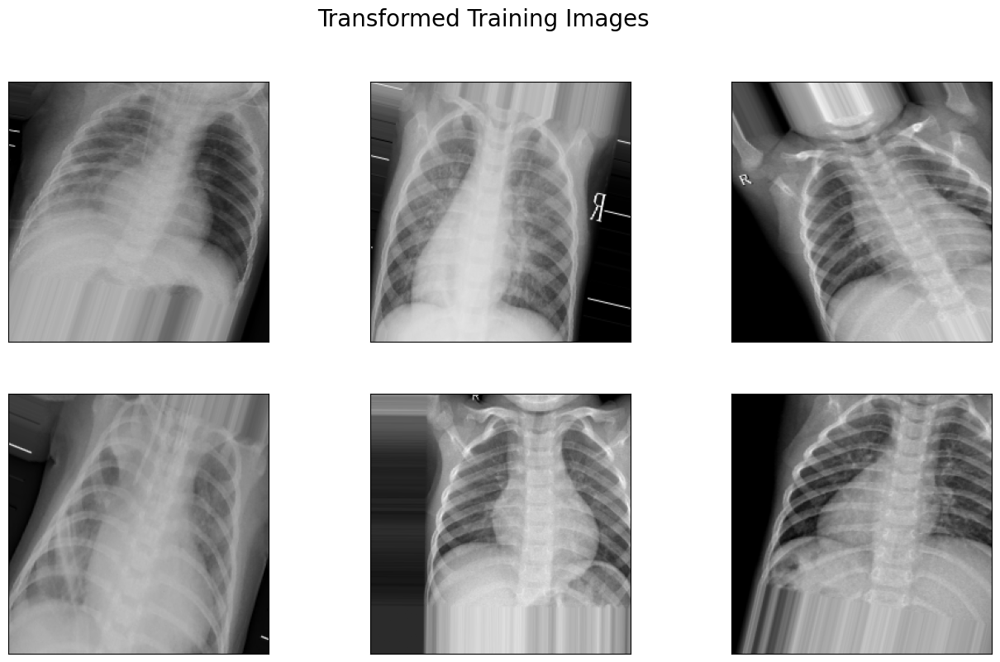

In [ ]:
## Let's also look at what the data augmentation did for us

# Get the first batch of data from the training generator
batch = train_generator.next()

# Extract the images from the batch
images = batch[0][:6]

# Create a 2x3 grid for displaying the images
plt.figure(figsize=(16, 9))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i])
    plt.xticks([])  # Remove x-axis ticks
    plt.yticks([])  # Remove y-axis ticks

plt.suptitle('Transformed Training Images', fontsize=20)
plt.show()


The training data contains different variations of the images, such as rotations, translations, and flips.

This helps the model become more robust and invariant to these variations when it encounters them in real-world data.

## MODELING

The model below is a simple CNN.

1. [Baseline Model](Notebooks/baseline_model.ipynb)

The next model improves upon this model by adding a few more layers both convolutional and dense.

2. [Model 2 ](Notebooks/model2.ipynb)


The next model adds regularization to the layers by use of Dropout Layers.

3. [Model 3](Notebooks/model3.ipynb)

The next model improves upon the previous by using learning rate decay for each epoch.

4. [Model 4](Notebooks/model4)

The next model tries to improve on the previous by using Double Convolutional Layers.

5. [Model 5](Notebooks/model5.ipynb)

The next model tries to improve on the previous layers by using the most layers both convolutional and dense to fully capture all the patterns in the data.

6. [Model 6](Notebooks/model6.ipynb)

The last two models are both models which use other CNNs as a base. (Transfer Learning Models).

You will find them in this notebook.

# Model Performance.

### The 2nd best Performing Model.
#### Model 7:

## Model 7 (VGG 16)

In [10]:
import keras
vgg_base = keras.applications.VGG16(
    weights='imagenet',
    input_shape=(image_height, image_width, 3),
    include_top=False
)

vgg_base.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


In [13]:
from keras.models import Sequential
from keras.layers import Dense, Flatten
model7 = Sequential()

model7.add(vgg_base)
model7.add(Flatten())
model7.add(Dense(512, activation='relu'))
model7.add(Dense(256, activation='relu'))
model7.add(Dense(128, activation='relu'))
model7.add(Dense(64, activation='relu'))
model7.add(Dense(1, activation='sigmoid'))

for layer in model7.layers:
    print(layer.name, layer.trainable)

vgg16 False
flatten True
dense True
dense_1 True
dense_2 True
dense_3 True
dense_4 True


In [ ]:
checkpoint = keras.callbacks.ModelCheckpoint(
    monitor='val_loss',
    filepath='transfer_vgg.h5',
    save_best_only=True,
    verbose=0
)

# Define a callback for early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)

In [ ]:
from keras import optimizers
model7.compile(
    loss='binary_crossentropy',
    optimizer=optimizers.Adam(),
    metrics=['accuracy']
)

print(model7.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_4 (Flatten)         (None, 25088)             0         
                                                                 
 dense_12 (Dense)            (None, 512)               12845568  
                                                                 
 dense_13 (Dense)            (None, 256)               131328    
                                                                 
 dense_14 (Dense)            (None, 128)               32896     
                                                                 
 dense_15 (Dense)            (None, 64)                8256      
                                                                 
 dense_16 (Dense)            (None, 1)                

In [ ]:
epochs = 20
history7 = model7.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator,
    callbacks=[checkpoint, early_stopping],
)

Epoch 1/20
139/139 [==============================] - ETA: 0s - loss: 0.2694 - acc: 0.8911

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


139/139 [==============================] - 130s 910ms/step - loss: 0.2694 - acc: 0.8911 - val_loss: 0.3553 - val_acc: 0.8434
Epoch 2/20
139/139 [==============================] - 112s 808ms/step - loss: 0.2063 - acc: 0.9204 - val_loss: 0.3279 - val_acc: 0.8634
Epoch 3/20
139/139 [==============================] - 111s 802ms/step - loss: 0.1545 - acc: 0.9366 - val_loss: 0.1474 - val_acc: 0.9461
Epoch 4/20
139/139 [==============================] - 111s 797ms/step - loss: 0.1536 - acc: 0.9425 - val_loss: 0.1214 - val_acc: 0.9599
Epoch 5/20
139/139 [==============================] - 112s 805ms/step - loss: 0.1344 - acc: 0.9461 - val_loss: 0.3626 - val_acc: 0.8509
Epoch 6/20
139/139 [==============================] - 111s 802ms/step - loss: 0.1407 - acc: 0.9436 - val_loss: 0.1643 - val_acc: 0.9261
Epoch 7/20
139/139 [==============================] - 111s 801ms/step - loss: 0.1242 - acc: 0.9520 - val_loss: 0.2282 - val_acc: 0.9085
Epoch 8/20
139/139 [==============================] - 112s 

In [ ]:
#Save the training history
import pickle
with open('history7.pkl', 'wb') as file:
    pickle.dump(history7.history, file)

In [ ]:
#load the model
import pickle
with open('/content/drive/MyDrive/history7.pkl', 'rb') as file:
    history7 = pickle.load(file)

In [29]:
from keras import models
best_model7 = models.load_model('/content/drive/MyDrive/transfer_vgg.h5')

## Model Structure

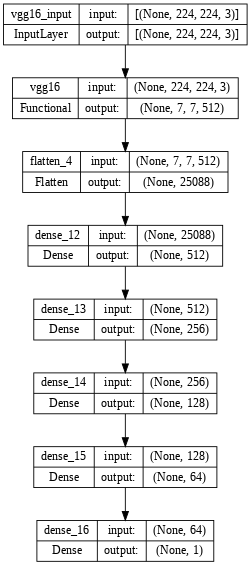

In [44]:
from keras import utils
utils.plot_model(model=best_model7,show_shapes=True,dpi=64)

## Confusion Matrix

20/20 [==============================] - 6s 292ms/step


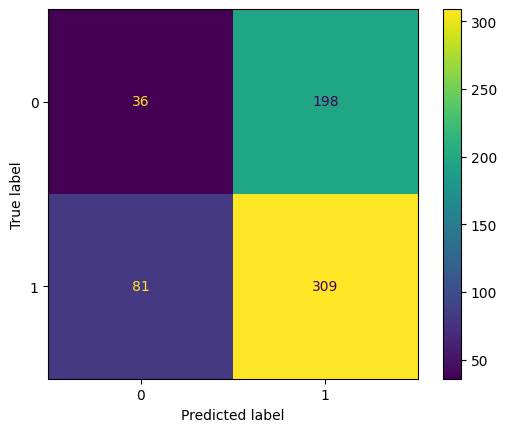

In [31]:
test_predictions = np.round(best_model7.predict(test_generator),0)
test_actual = test_generator.labels

# Generate confusion matrix for test set
c_matrix = confusion_matrix(test_actual,test_predictions)
ConfusionMatrixDisplay(c_matrix).plot()

## LIME Explanation

In [32]:
explainer = lime_image.LimeImageExplainer()

In [33]:
def extract_selected(model, true, predicted, test_func):
    selected = []

    # Iterate through the test dataset
    for batch in test_generator:
        images, labels = batch

        # Iterate through images and their corresponding labels in the batch
        for image, label in zip(images, labels):

            # Check if the image matches the specified true and predicted classes
            predicted_class = np.round(model.predict(np.expand_dims(image, axis=0)), 0)
            if predicted_class == predicted and label == true:
                selected.append(image)

            # Return if 6 images are selected
            if len(selected) >= 6:
                return selected

    return selected

In [34]:
def lime_explain(model, selected_images, title, explainer):
    fig, ax = plt.subplots(2, 3, figsize=(12, 6))

    # Loop through each of up to 6 provided images
    for idx, image in enumerate(selected_images):
        active_axis = ax[idx // 3][idx % 3]
        active_axis.set_xticks([])
        active_axis.set_yticks([])

        # Generate explanation for prediction using Lime image explainer
        explanation = explainer.explain_instance(
            image, model.predict, top_labels=1, hide_color=0, num_samples=1000
        )

        # Generate image mask for explanation
        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=False, num_features=8, hide_rest=False
        )

        # Show the image and explanation
        active_axis.imshow(mark_boundaries(temp, mask))

    fig.set_facecolor('#FFFFFF')
    fig.suptitle(title, fontsize=32)
    return fig

# Example usage:
# lime_explain(model, selected_images, "LIME Explanations", explainer)


1/1 [==============================] - 0s 21ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


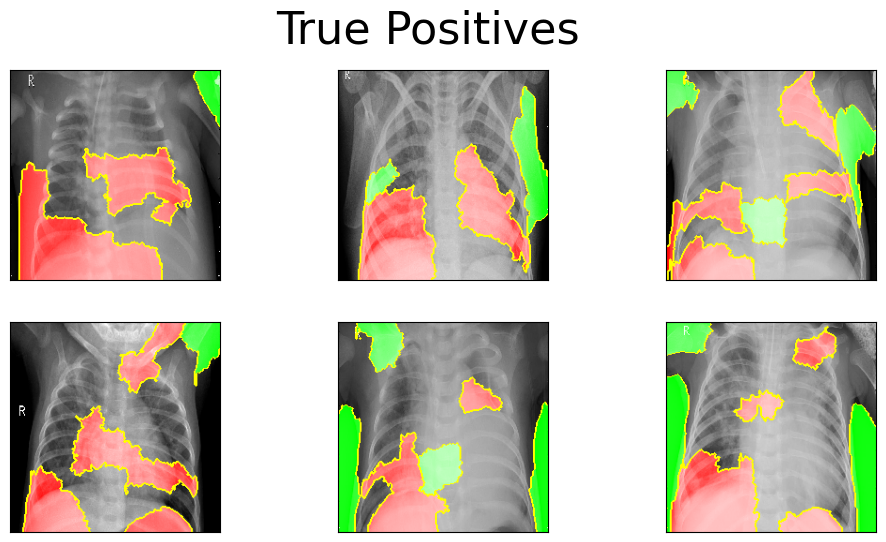

In [35]:
# Extract true positives from test set and explain with lime
tp = extract_selected(best_model7,1,1,test_generator)
tp_expl = lime_explain(best_model7,tp,"True Positives", explainer)

1/1 [==============================] - 0s 28ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 64ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 73ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


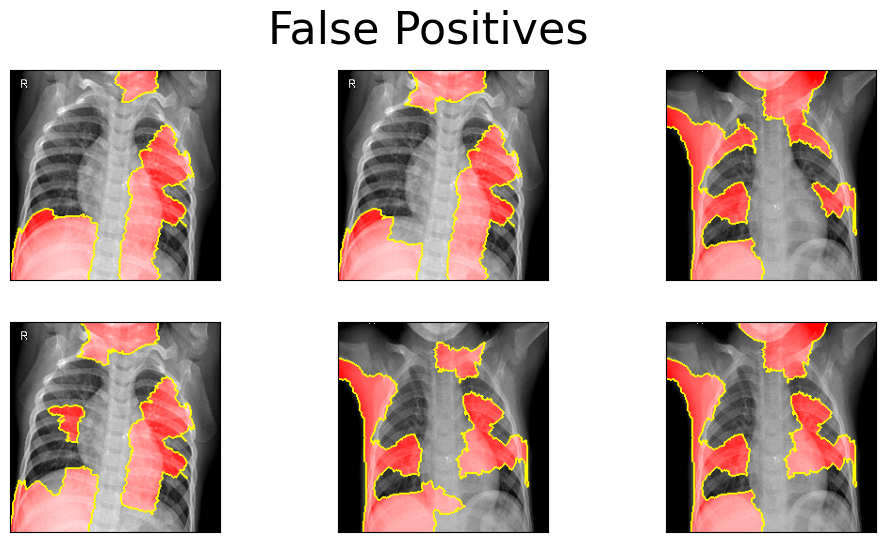

In [38]:
# Extract false positives from test set and explain with lime
tp = extract_selected(best_model7,1,0,test_generator)
tp_expl = lime_explain(best_model7,tp,"False Positives", explainer)

1/1 [==============================] - 0s 28ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


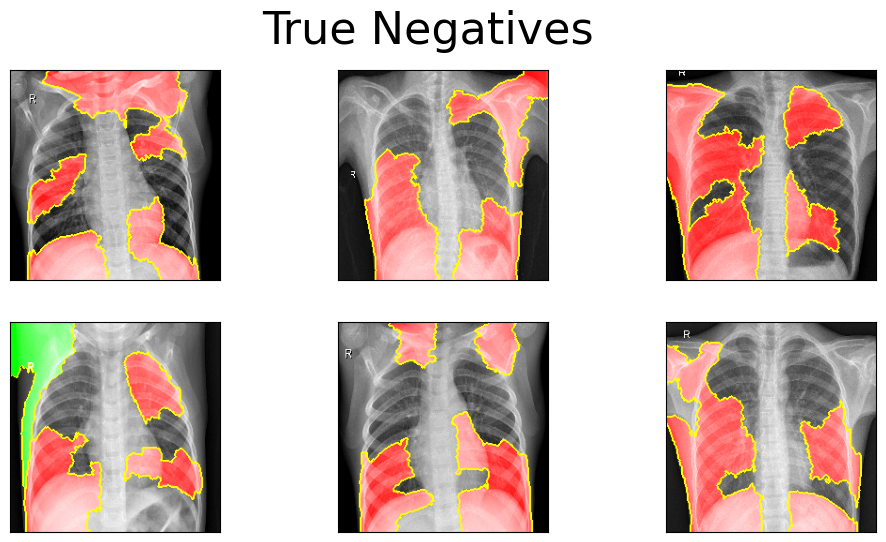

In [41]:
# Extract false positives from test set and explain with lime
tp = extract_selected(best_model7,0,0,test_generator)
tp_expl = lime_explain(best_model7,tp,"True Negatives", explainer)

1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


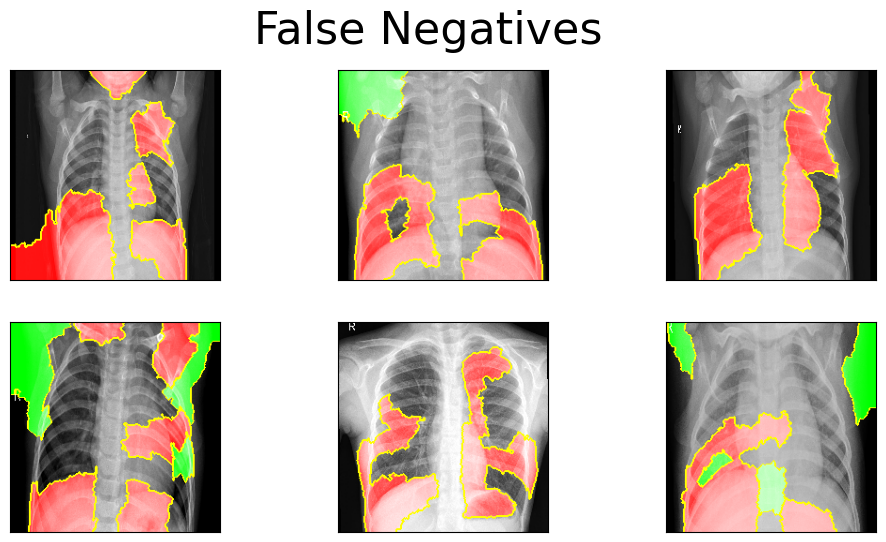

In [42]:
# Extract false positives from test set and explain with lime
tp = extract_selected(best_model7,0,1,test_generator)
tp_expl = lime_explain(best_model7,tp,"False Negatives", explainer)

## Layer Activations

The subsequent code cell provides the activations for every node in the network when processing a single image.

In [50]:
# Collect outputs for the vgg16 layers
import numpy as np
layer_outputs = [layer.output for layer in best_model7.layers[0].layers]

activation_model = models.Model(
    inputs = best_model7.layers[0].input,
    outputs = layer_outputs
)

# Predict the first image in test dataset and save intermediate activations
tx_activations = activation_model.predict(np.expand_dims(test_generator[0][0][0],axis=0))

1/1 [==============================] - 0s 162ms/step


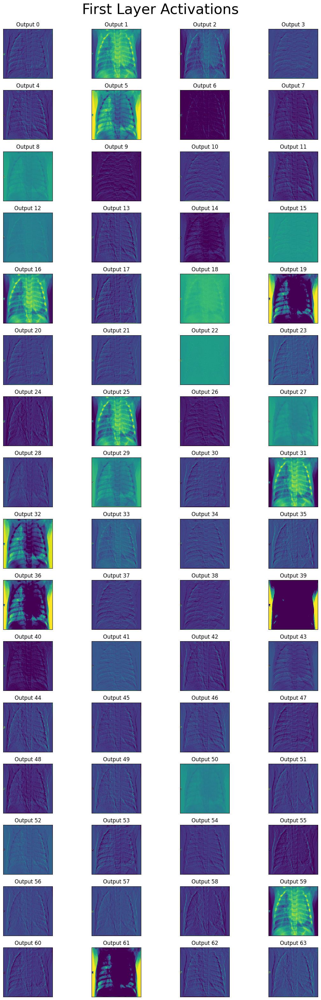

In [51]:
tx_l0_fig, tx_l0_ax = plt.subplots(16, 4, figsize=(12,32))

# Loop through each node in the first layer size 64
for idx in range(64):
    active_axis = tx_l0_ax[idx//4, idx%4]

    # EXtract and show node's activation
    first_layer_activation = tx_activations[1]
    active_axis.matshow(first_layer_activation[0 , :, :, idx])
    active_axis.set_xticks([])
    active_axis.set_yticks([])
    active_axis.set_title('Output ' + str(idx))
tx_l0_fig.set_facecolor('#FFFFFF')
tx_l0_fig.suptitle('First Layer Activations\n',fontsize=32);
tx_l0_fig.tight_layout()

## Model 8

## Transfer VGG 16 (Learning Rate Decay)

In [14]:
vgg_base = keras.applications.VGG16(
    weights='imagenet',
    input_shape=(image_height, image_width, 3),
    include_top=False
)

vgg_base.trainable = False

In [15]:
model8 = Sequential()

model8.add(vgg_base)
model8.add(Flatten())
model8.add(Dense(512, activation='relu'))
model8.add(Dense(256, activation='relu'))
model8.add(Dense(128, activation='relu'))
model8.add(Dense(64, activation='relu'))
model8.add(Dense(1, activation='sigmoid'))

for layer in model8.layers:
    print(layer.name, layer.trainable)

vgg16 False
flatten_1 True
dense_5 True
dense_6 True
dense_7 True
dense_8 True
dense_9 True


In [18]:
from keras.callbacks import EarlyStopping, ModelCheckpoint
checkpoint = ModelCheckpoint(
    monitor='val_loss',
    filepath='transfer_vgg_decay.h5',
    save_best_only=True,
    verbose=0
)

# Define a callback for early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)

In [19]:
scheduler = optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,
    decay_rate=0.96,
    decay_steps=2500)

In [20]:
model8.compile(
    loss='binary_crossentropy',
    optimizer=optimizers.Adam(learning_rate=scheduler),
    metrics=['accuracy']
)

print(model8.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_5 (Dense)             (None, 512)               12845568  
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dense_7 (Dense)             (None, 128)               32896     
                                                                 
 dense_8 (Dense)             (None, 64)                8256      
                                                                 
 dense_9 (Dense)             (None, 1)                

In [21]:
epochs = 15
history8 = model8.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator,
    callbacks=[checkpoint, early_stopping],
)

Epoch 1/15
139/139 [==============================] - 1315s 9s/step - loss: 1.3967 - accuracy: 0.8561 - val_loss: 0.1486 - val_accuracy: 0.9449
Epoch 2/15
139/139 [==============================] - 113s 810ms/step - loss: 0.2037 - accuracy: 0.9224 - val_loss: 0.1661 - val_accuracy: 0.9311
Epoch 3/15
139/139 [==============================] - 112s 808ms/step - loss: 0.2000 - accuracy: 0.9213 - val_loss: 0.1695 - val_accuracy: 0.9348
Epoch 4/15
139/139 [==============================] - 110s 793ms/step - loss: 0.1430 - accuracy: 0.9465 - val_loss: 0.2161 - val_accuracy: 0.9173
Epoch 5/15
139/139 [==============================] - 110s 789ms/step - loss: 0.1416 - accuracy: 0.9479 - val_loss: 0.2387 - val_accuracy: 0.8972
Epoch 6/15
139/139 [==============================] - 109s 785ms/step - loss: 0.1396 - accuracy: 0.9447 - val_loss: 0.2590 - val_accuracy: 0.9123


In [23]:
#Save the training history
import pickle
with open('history8.pkl', 'wb') as file:
    pickle.dump(history8.history, file)

In [27]:
from keras.models import load_model
best_model8 = load_model('transfer_vgg_decay.h5')

### Model Structure

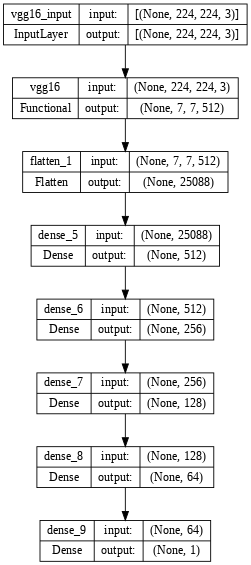

In [45]:
utils.plot_model(model=best_model8,show_shapes=True,dpi=64)

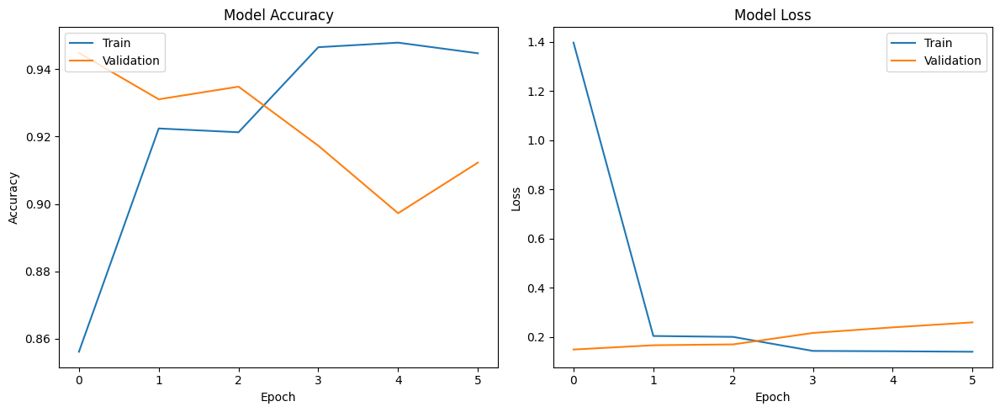

In [26]:
#plot the graphs
import matplotlib.pyplot as plt
# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history8.history['accuracy'])
plt.plot(history8.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history8.history['loss'])
plt.plot(history8.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.tight_layout()
plt.show()

In [28]:
best_model8.evaluate(test_generator)

20/20 [==============================] - 152s 8s/step - loss: 0.3425 - accuracy: 0.8686


[0.34248918294906616, 0.8685897588729858]

In [39]:
best_model8.evaluate(train_generator)

139/139 [==============================] - 117s 843ms/step - loss: 0.1722 - accuracy: 0.9348


[0.17224125564098358, 0.9348218441009521]

In [30]:
best_model8.evaluate(val_generator)

25/25 [==============================] - 9s 361ms/step - loss: 0.1486 - accuracy: 0.9449


[0.14863570034503937, 0.9448621273040771]

## Confusion Matrix Display

20/20 [==============================] - 8s 384ms/step


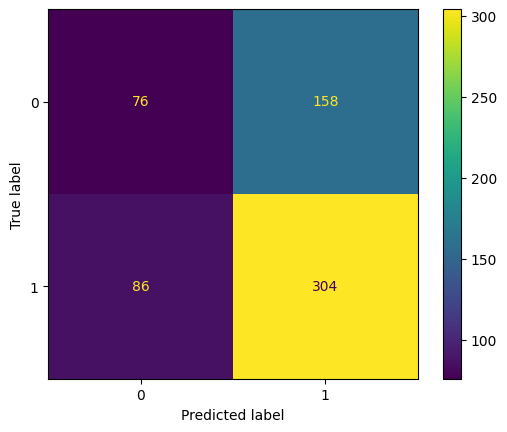

In [40]:
test_predictions = np.round(best_model8.predict(test_generator),0)
test_actual = test_generator.labels

# Generate confusion matrix for test set
c_matrix = confusion_matrix(test_actual,test_predictions)
ConfusionMatrixDisplay(c_matrix).plot()

## LIME Explanation

1/1 [==============================] - 0s 19ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 129ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


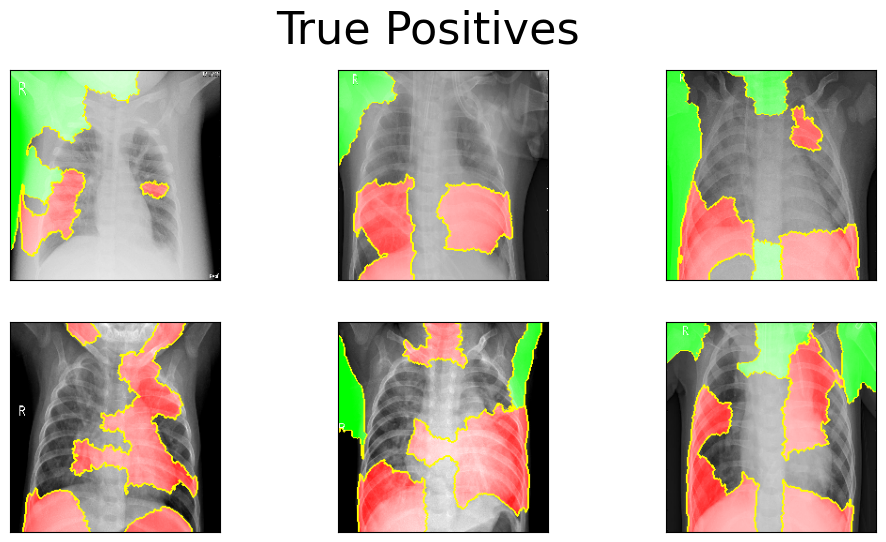

In [46]:
# Extract false positives from test set and explain with lime
tp = extract_selected(best_model8,1,1,test_generator)
tp_expl = lime_explain(best_model8,tp,"True Positives", explainer)

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


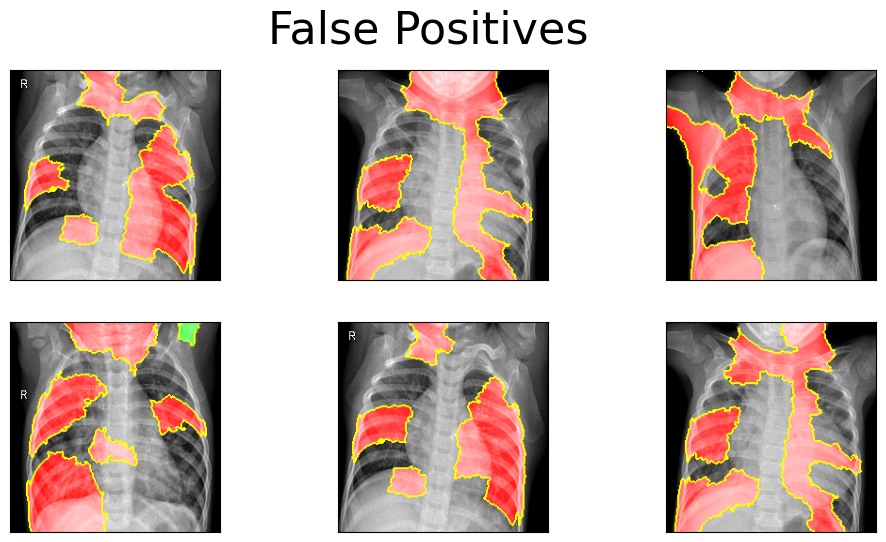

In [47]:
# Extract false positives from test set and explain with lime
tp = extract_selected(best_model8,1,0,test_generator)
tp_expl = lime_explain(best_model8,tp,"False Positives", explainer)

1/1 [==============================] - 0s 28ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


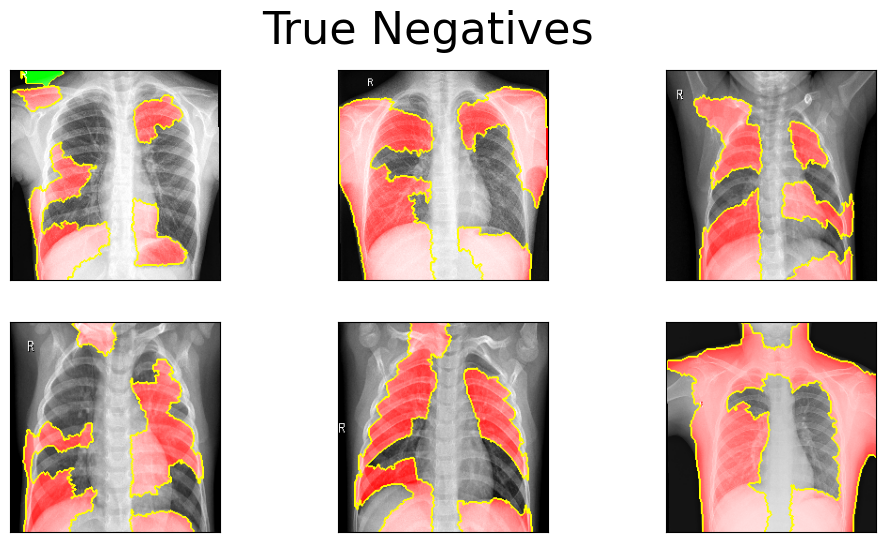

In [48]:
# Extract false positives from test set and explain with lime
tp = extract_selected(best_model8,0,0,test_generator)
tp_expl = lime_explain(best_model8,tp,"True Negatives", explainer)

1/1 [==============================] - 0s 20ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


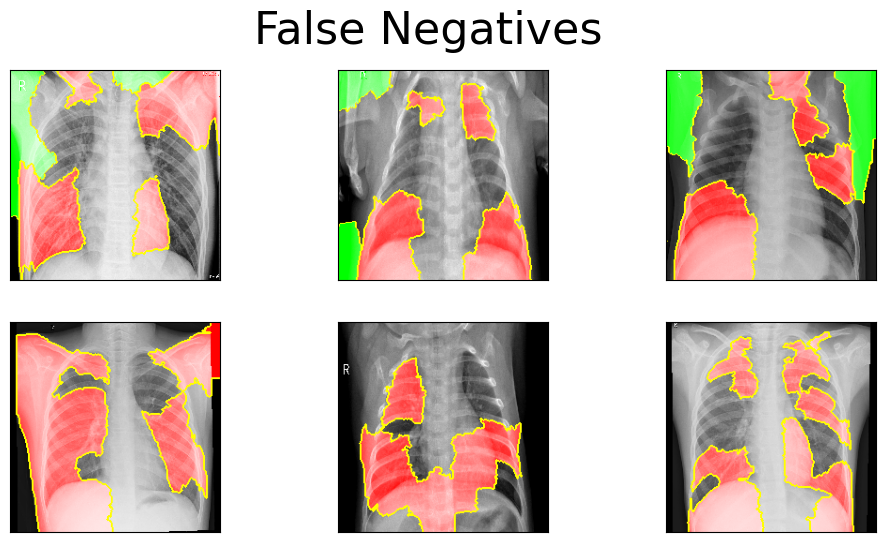

In [49]:
# Extract false positives from test set and explain with lime
tp = extract_selected(best_model8,0,1,test_generator)
tp_expl = lime_explain(best_model8,tp,"False Negatives", explainer)

## Layer Activations

In [53]:
# Collect outputs for the vgg16 layers
import numpy as np
layer_outputs = [layer.output for layer in best_model8.layers[0].layers]

activation_model = models.Model(
    inputs = best_model8.layers[0].input,
    outputs = layer_outputs
)

# Predict the first image in test dataset and save intermediate activations
tx_activations = activation_model.predict(np.expand_dims(test_generator[0][0][0],axis=0))

1/1 [==============================] - 0s 340ms/step


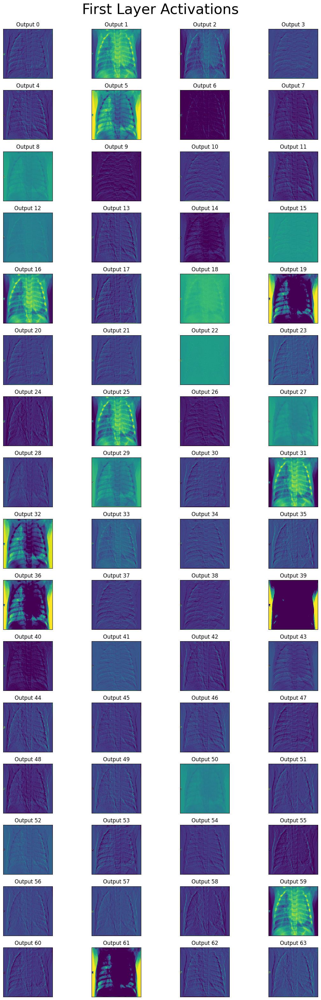

In [54]:
tx_l0_fig, tx_l0_ax = plt.subplots(16, 4, figsize=(12,32))

# Loop through each node in the first layer size 64
for idx in range(64):
    active_axis = tx_l0_ax[idx//4, idx%4]

    # EXtract and show node's activation
    first_layer_activation = tx_activations[1]
    active_axis.matshow(first_layer_activation[0 , :, :, idx])
    active_axis.set_xticks([])
    active_axis.set_yticks([])
    active_axis.set_title('Output ' + str(idx))
tx_l0_fig.set_facecolor('#FFFFFF')
tx_l0_fig.suptitle('First Layer Activations\n',fontsize=32);
tx_l0_fig.tight_layout()

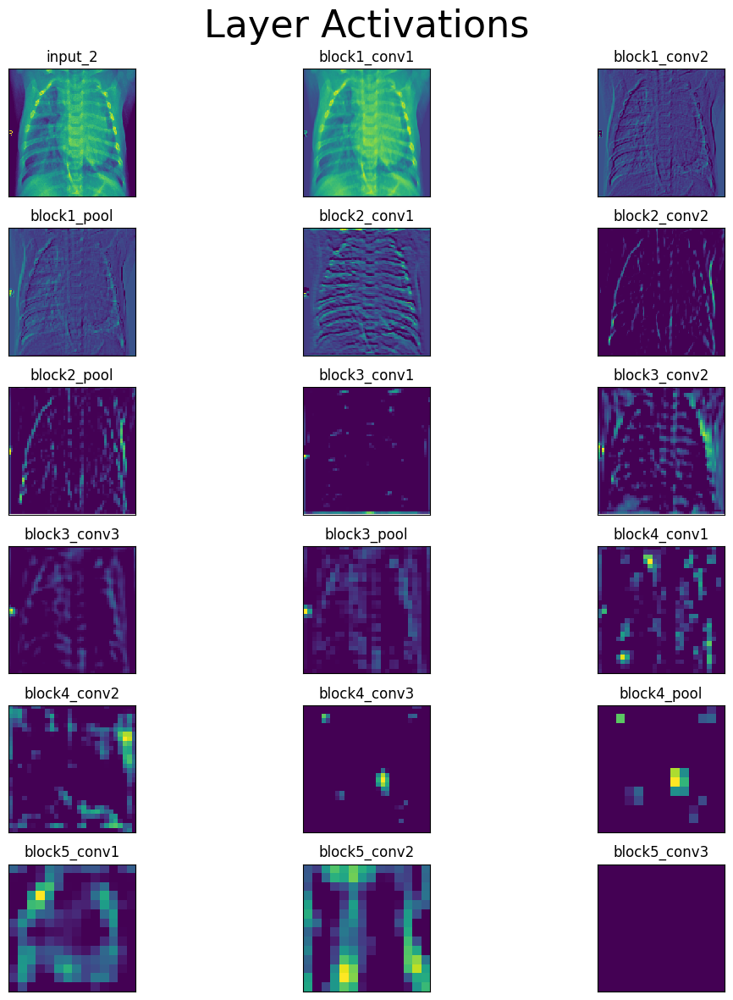

In [56]:
tx_act_fig,tx_act_ax = plt.subplots(6,3,figsize=(12,12))

# Get name for each of the vgg16 layers
tx_layer_names = []
for layer in best_model7.layers[0].layers:
    tx_layer_names.append(layer.name)

# Loop through each of the vgg16 layers
for idx in range(18):
    active_axis = tx_act_ax[idx//3][idx%3]

    # Show the activation for the first node in that layer
    cur_layer = tx_activations[idx]
    active_axis.matshow(cur_layer[0,:,:,1])
    active_axis.set_title(tx_layer_names[idx])
    active_axis.set_xticks([])
    active_axis.set_yticks([])
tx_act_fig.set_facecolor('#FFFFFF')
tx_act_fig.suptitle('Layer Activations',fontsize=32);
tx_act_fig.tight_layout()

## Conclusion

Nour Medicine could definitely use this model and deploy it to help diagnose pneumonia.
Admittedly, the model could be better by using more data, trying different architectures and fine-tuning.
